# Package import

In [2]:
from pathlib import Path
import sys
import os.path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import json
from scipy.stats import f_oneway, gaussian_kde, mannwhitneyu, pearsonr, spearmanr
import seaborn as sns

from tqdm.notebook import tqdm
sns.set_style('whitegrid')

import matplotlib.font_manager as fm

# Precise1k and iModulon Data processing

## Load the data from ./Data/ folder

In [3]:
# precise1k = load_json_model('../Data/p1k.json.gz')

In [4]:
RegulonDB_TRN = pd.read_csv('../Data/RegulonDB_TRN_C_and_S.csv', index_col = 0)

In [5]:
P1K_Gene_Presence_Matrix = pd.read_csv("../Data/P1K_Gene_Presence_Matrix.csv", index_col=0)

In [6]:
biocyc_info = pd.read_csv('../Data/biocyc_info.txt', sep="\t")

### PRECISE-1K: X M A log_tpm gene_presence_matrix

In [7]:
# precise1k.reoptimize_thresholds()

In [8]:
# precise1k.recompute_thresholds(550)

In [9]:
# imdb_gene_presence(precise1k)[0].to_csv('P1K_Gene_Presence_Matrix.csv')

In [10]:
# P1K_Gene_Presence_Matrix = pd.read_csv("P1K_Gene_Presence_Matrix.csv", index_col=0)

In [11]:
P1K_M = pd.read_csv('../Data/P1K_M.csv', index_col=0)

In [12]:
P1K_A = pd.read_csv('../Data/P1K_A.csv', index_col=0)

In [13]:
P1K_X = pd.read_csv('../Data/P1K_X.csv', index_col=0)

In [14]:
P1K_log_tpm = pd.read_csv('../Data/P1K_log_tpm.csv', index_col=0)

In [15]:
def map_accession_to_gene_name(df, biocyc_info):

    # Reset index if 'Accession' is the index, and rename the column
    if df.index.name == 'Accession' or df.index.name is None:
        df = df.reset_index()
        df.rename(columns={'index': 'Accession'}, inplace=True)
        
    # Merge with biocyc_info to map 'Accession' to 'Gene Name'
    merged_df = df.merge(biocyc_info[['Accession', 'Gene Name']], on='Accession', how='left')

    # Identify rows with NaN 'Gene Name'
    removed_indices = merged_df[merged_df['Gene Name'].isna()]['Accession'].tolist()

    # Print the original indices that were removed
    print("Original indices removed due to NaN 'Gene Name':", removed_indices)

    # Set 'Gene Name' as the new index and drop the 'Accession' column
    merged_df.set_index('Gene Name', inplace=True)
    merged_df.drop(columns=['Accession'], inplace=True)

    # Remove rows with NaN as index
    merged_df = merged_df[merged_df.index.notna()]
    
    return merged_df

In [16]:
P1K_M = map_accession_to_gene_name(P1K_M, biocyc_info)

Original indices removed due to NaN 'Gene Name': []


In [17]:
P1K_X = map_accession_to_gene_name(P1K_X, biocyc_info)

Original indices removed due to NaN 'Gene Name': []


In [18]:
P1K_log_tpm = map_accession_to_gene_name(P1K_log_tpm, biocyc_info)

Original indices removed due to NaN 'Gene Name': []


In [19]:
P1K_Gene_Presence_Matrix = map_accession_to_gene_name(P1K_Gene_Presence_Matrix, biocyc_info)

Original indices removed due to NaN 'Gene Name': []


In [20]:
P1K_merged = pd.read_csv('../Data/P1K_merged.csv', index_col=0)

In [21]:
P1K_merged['Total_Explained_Variance'] = P1K_merged['Total_Explained_Variance'].apply(lambda x: max(x, 0))

In [22]:
iterative_M_Gene_Presence_Matrix = pd.read_csv("/home/gaoyuan/PhD/ICA_Extension_Mechanism/5_Iterative_substract_ICA/Clean_iterative_M_Gene_Presence_Matrix.csv", index_col=0)

In [23]:
iterative_M_Gene_Presence_Matrix = map_accession_to_gene_name(iterative_M_Gene_Presence_Matrix, biocyc_info)

Original indices removed due to NaN 'Gene Name': []


In [24]:
P1K_num_iterative_iM = pd.DataFrame(iterative_M_Gene_Presence_Matrix.sum(axis=1), columns=['num_iterative_iM'])

In [25]:
P1K_merged = pd.concat([P1K_merged, P1K_num_iterative_iM], axis=1)

In [26]:
# P1K_merged['num_iterative_iM'] = P1K_merged['num_iterative_iM'] + P1K_merged['num_iM']

## What does gene expression magnitude vs gene expression variation look like in P1k?

In [27]:
def scatter_plot_with_box_plots(dataframe, mad_column, median_column, x_label, y_label, title, ratio=0.2, x_lim=None, y_lim=None, color='blue'):
    # Set the aesthetic style of the plots
    sns.set(style="white")

    # Create the figure and axes
    fig = plt.figure(figsize=(4, 4))

    # Define grid spec with ratio adjustment
    height_ratios = [ratio, 1-ratio]  # ratio for the top subplot, remaining for the main plot
    width_ratios = [1-ratio, ratio]   # ratio for the main plot, remaining for the right subplot

    grid = plt.GridSpec(2, 2, height_ratios=height_ratios, width_ratios=width_ratios, hspace=0.05, wspace=0.05)

    # Main scatter plot
    main_ax = fig.add_subplot(grid[1, 0])
    main_ax.scatter(dataframe[median_column], dataframe[mad_column], color=color, alpha=0.5)
    main_ax.set_xlabel(x_label)
    main_ax.set_ylabel(y_label)
    main_ax.grid(False)
    main_ax.spines['top'].set_linewidth(1)
    main_ax.spines['right'].set_linewidth(1)
    main_ax.spines['bottom'].set_linewidth(1)
    main_ax.spines['left'].set_linewidth(1)
    main_ax.tick_params(top=False, right=False, which='both', labeltop=False, labelright=False)
    
    # Set the limits for the main scatter plot if provided
    if x_lim:
        main_ax.set_xlim(x_lim)
    if y_lim:
        main_ax.set_ylim(y_lim)

    # Box plot for the x-axis
    x_box = fig.add_subplot(grid[0, 0], sharex=main_ax)
    sns.boxplot(x=dataframe[median_column], ax=x_box, color=color)
    x_box.set(xlabel='')
    x_box.set(yticks=[], ylabel='')
    x_box.grid(False)
    x_box.spines['top'].set_linewidth(1)
    x_box.spines['right'].set_linewidth(1)
    x_box.spines['bottom'].set_linewidth(1)
    x_box.spines['left'].set_linewidth(1)
    x_box.tick_params(bottom=False, top=False, labelbottom=False)

    # Box plot for the y-axis
    y_box = fig.add_subplot(grid[1, 1], sharey=main_ax)
    sns.boxplot(y=dataframe[mad_column], ax=y_box, color=color)
    y_box.set(ylabel='')
    y_box.set(xticks=[], xlabel='')
    y_box.grid(False)
    y_box.spines['top'].set_linewidth(1)
    y_box.spines['right'].set_linewidth(1)
    y_box.spines['bottom'].set_linewidth(1)
    y_box.spines['left'].set_linewidth(1)
    y_box.tick_params(left=False, right=False, labelleft=False)

    # Add titles and labels
    x_box.set_title(title, y=1.1)

    # Show the plot
    plt.show()

In [28]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def plot_scatter_with_fit(X, A, gene_name, imodulon_name):
    # Extract the rows
    x_values = X.loc[gene_name].values.reshape(-1, 1)
    y_values = A.loc[imodulon_name].values
    
    plt.figure(figsize=(15, 2))
    # Create scatter plot
    plt.scatter(x_values, y_values, label='Data points')

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(x_values, y_values)
    y_pred = model.predict(x_values)
    
    # Plot the line of best fit
    plt.plot(x_values, y_pred, color='red', label='Line of best fit')

    # Calculate the R^2 value
    r2 = r2_score(y_values, y_pred)
    
    # Display the plot with labels and legend
    plt.xlabel(gene_name)
    plt.ylabel(imodulon_name)
    plt.title(f'Scatter Plot of {gene_name} Expression and {imodulon_name} Activity\n$R^2$ = {r2:.2f}')
    plt.legend()
    plt.show()

In [29]:
def calculate_explained_variance(M_matrix, A_matrix, log_tpm):
    # Check if inputs are DataFrames and convert to numpy arrays if needed
    if isinstance(M_matrix, pd.DataFrame) or isinstance(M_matrix, pd.Series):
        M_matrix = M_matrix.values.flatten()
    
    if isinstance(A_matrix, pd.DataFrame):
        A_matrix = A_matrix.values
    
    if isinstance(log_tpm, pd.DataFrame) or isinstance(log_tpm, pd.Series):
        log_tpm = log_tpm.values.flatten()
    
    # Compute the predicted values
    predicted_values = np.dot(M_matrix, A_matrix)  # M_matrix is 1xM, A_matrix is MxN, result is 1xN

    # Calculate the baseline (mean-centered log_tpm)
    baseline = log_tpm - np.mean(log_tpm)  # mean-center the log_tpm

    # Calculate the residual variance
    residuals = log_tpm - predicted_values
    residual_variance = np.sum((residuals - np.mean(residuals)) ** 2)

    # Calculate the total variance
    total_variance = np.sum((log_tpm - np.mean(log_tpm)) ** 2)

    # Compute the explained variance (R^2)
    explained_variance = 1 - (residual_variance / total_variance)
    
    return explained_variance

In [30]:
def compute_explained_variance_change(M, A, X, P1K_Gene_Presence_Matrix, gene):

    M = M.loc[[gene]]
    X = X.loc[[gene]]
    
    # Calculate the original explained variance
    original_exp_var = calculate_explained_variance(M, A, X)
    
    # Initialize a dictionary to store the explained variance changes
    exp_var_changes = {}

    # Iterate through each row of A
    for row_name in A.index:
        # Remove the corresponding row from A
        modified_A = A.drop(row_name, axis=0)
        
        # Remove the corresponding column from M and X
        modified_M = M.drop(row_name, axis=1)
        modified_X = X
        
        # Recalculate the explained variance
        new_exp_var = calculate_explained_variance(modified_M, modified_A, modified_X)
        
        # Calculate the change in explained variance
        exp_var_change = original_exp_var - new_exp_var
        
        # Store the result in the dictionary
        exp_var_changes[row_name] = exp_var_change

    # Convert the dictionary to a DataFrame
    explained_variance_df = pd.DataFrame.from_dict(exp_var_changes, orient='index', columns=['Explained Variance'])
    explained_variance_df.reset_index(inplace=True)

    
    explained_variance_df.columns = ['iModulon', 'Explained Variance Change if removed']

    explained_variance_df = explained_variance_df.sort_values(by='Explained Variance Change if removed', ascending=False)
    
    explained_variance_df['Presence'] = explained_variance_df['iModulon'].apply(
        lambda x: 'Yes' if P1K_Gene_Presence_Matrix.loc[gene, x] else 'No'
    )
    
    # Calculate and print the sum of Explained Variance for 'Presence Yes' and 'Presence No'
    presence_yes_sum = explained_variance_df[explained_variance_df['Presence'] == 'Yes']['Explained Variance Change if removed'].sum()
    presence_no_sum = explained_variance_df[explained_variance_df['Presence'] == 'No']['Explained Variance Change if removed'].sum()
    
    # print(f"Sum of Explained Variance for 'Yes' iMs: {presence_yes_sum}")
    # print(f"Sum of Explained Variance for 'No' iMs: {presence_no_sum}")
    
    # Load custom font
    font_path = '/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman.ttf'
    font_prop = fm.FontProperties(fname=font_path)
    
    # Plot the explained variance for each iModulon
    plt.figure(figsize=(15, 3))
    plt.bar(explained_variance_df['iModulon'], explained_variance_df['Explained Variance Change if removed'])
    plt.xlabel('iModulon', fontproperties=font_prop)
    plt.ylabel('Explained Variance', fontproperties=font_prop)
    plt.title(f'Explained Variance by iModulon for Gene {gene}', fontproperties=font_prop)
    
    # Remove grid
    plt.grid(False)
    
    # Add a black border around the plot
    plt.gca().spines['top'].set_linewidth(1.0)
    plt.gca().spines['bottom'].set_linewidth(1.0)
    plt.gca().spines['left'].set_linewidth(1.0)
    plt.gca().spines['right'].set_linewidth(1.0)
    plt.gca().spines['top'].set_color('black')
    plt.gca().spines['bottom'].set_color('black')
    plt.gca().spines['left'].set_color('black')
    plt.gca().spines['right'].set_color('black')

    # Set font properties for ticks
    plt.xticks(fontproperties=font_prop, fontsize=10)  # Adjust fontsize for x-ticks
    plt.yticks(fontproperties=font_prop)

    # Remove x-ticks
    plt.xticks([])

    plt.show()
    return explained_variance_df

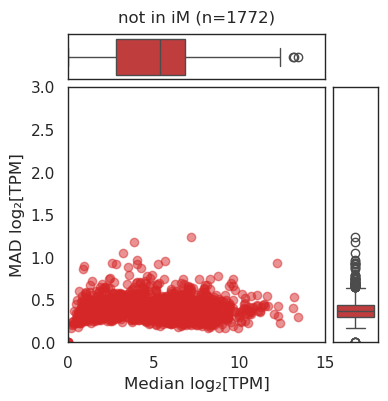

In [31]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] == 0], 'MAD', 'log_TPM_median', 'Median log₂[TPM]', 'MAD log₂[TPM]', 'not in iM (n=1772)', ratio = 0.15, x_lim=(0,15), y_lim=(0,3), color='#d62728')

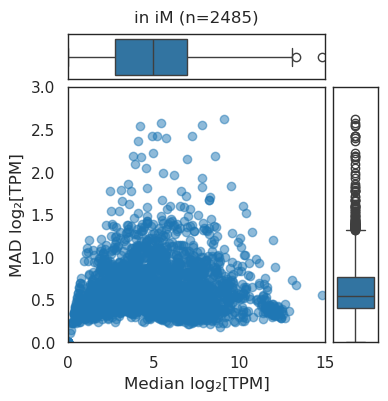

In [32]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] != 0], 'MAD', 'log_TPM_median', 'Median log₂[TPM]', 'MAD log₂[TPM]', 'in iM (n=2485)', ratio = 0.15, x_lim=(0,15), y_lim=(0,3), color='#1f77b4')

In [33]:
P1K_merged.columns

Index(['Total_Explained_Variance', 'Top_1_Explained_Variance',
       'Top_1_iModulon', 'Top_2_Explained_Variance', 'Top_2_iModulon',
       'Top_3_Explained_Variance', 'Top_3_iModulon', 'num_regulators',
       'num_iM', 'MAD', 'log_TPM_median', 'range_log_tpm',
       'quantile_range_log_tpm', 'num_iterative_iM'],
      dtype='object')

### MAD v.s. Total_Explained_Variance

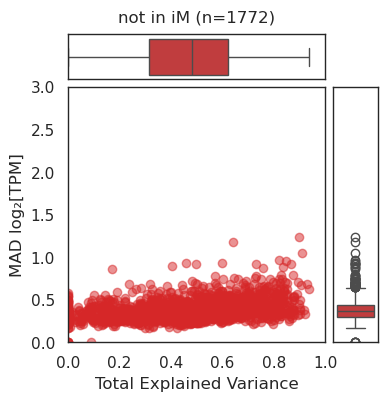

In [34]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] == 0], 'MAD', 'Total_Explained_Variance', 'Total Explained Variance', 'MAD log₂[TPM]', 'not in iM (n=1772)', ratio = 0.15, x_lim=(0,1), y_lim=(0,3), color='#d62728')

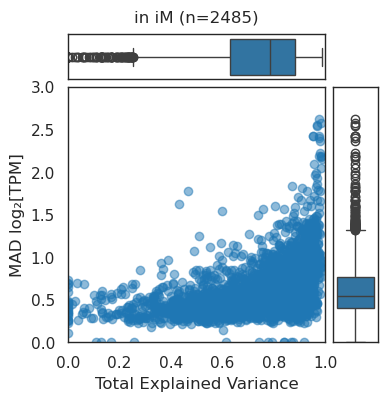

In [35]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] != 0], 'MAD', 'Total_Explained_Variance', 'Total Explained Variance', 'MAD log₂[TPM]', 'in iM (n=2485)', ratio = 0.15, x_lim=(0,1), y_lim=(0,3), color='#1f77b4')

### MAD v.s. Top_1_Explained_Variance

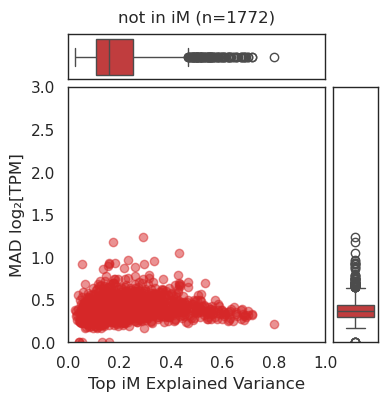

In [36]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] == 0], 'MAD', 'Top_1_Explained_Variance', 'Top iM Explained Variance', 'MAD log₂[TPM]', 'not in iM (n=1772)', ratio = 0.15, x_lim=(0,1), y_lim=(0,3), color='#d62728')

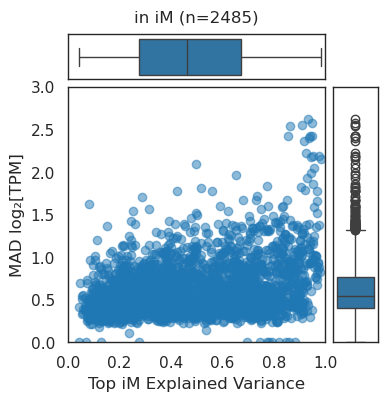

In [37]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] != 0], 'MAD', 'Top_1_Explained_Variance', 'Top iM Explained Variance', 'MAD log₂[TPM]', 'in iM (n=2485)', ratio = 0.15, x_lim=(0,1), y_lim=(0,3), color='#1f77b4')

### Quantile Range v.s. Top_1_Explained_Variance

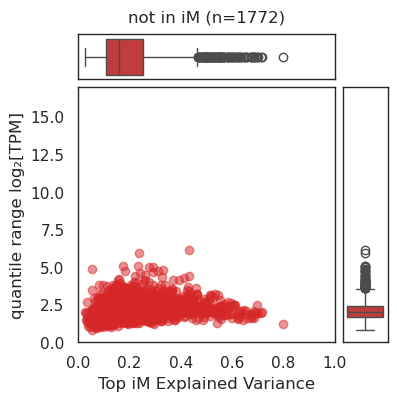

In [38]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] == 0], 'quantile_range_log_tpm', 'Top_1_Explained_Variance', 'Top iM Explained Variance', 'quantile range log₂[TPM]', 'not in iM (n=1772)', ratio = 0.15, x_lim=(0,1), y_lim=(0,17), color='#d62728')

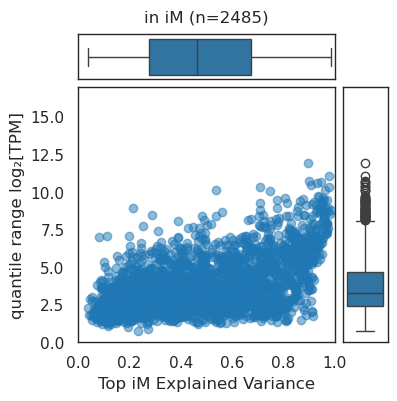

In [39]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] != 0], 'quantile_range_log_tpm', 'Top_1_Explained_Variance', 'Top iM Explained Variance', 'quantile range log₂[TPM]', 'in iM (n=2485)', ratio = 0.15, x_lim=(0,1), y_lim=(0,17), color='#1f77b4')

### Range v.s. MAD

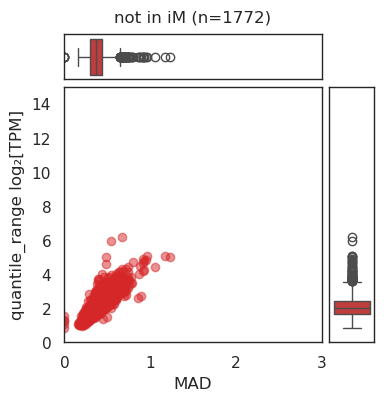

In [40]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] == 0], 'quantile_range_log_tpm', 'MAD', 'MAD', 'quantile_range log₂[TPM]', 'not in iM (n=1772)', ratio = 0.15, x_lim=(0,3), y_lim=(0,15), color='#d62728')

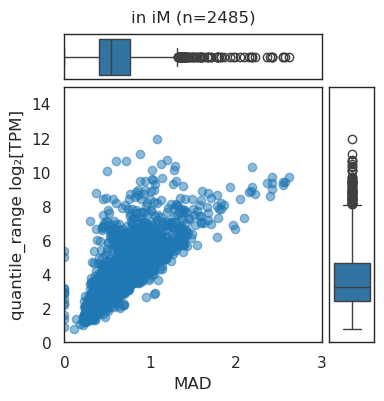

In [41]:
scatter_plot_with_box_plots(P1K_merged[P1K_merged['num_iM'] != 0], 'quantile_range_log_tpm', 'MAD', 'MAD', 'quantile_range log₂[TPM]', 'in iM (n=2485)', ratio = 0.15, x_lim=(0,3), y_lim=(0,15), color='#1f77b4')

In [42]:
# rank the genes by the M values in iM - if they are close to threshold

In [43]:
# left bottom corner - examples - MAD 1.5 - <0.2 top exp var

## 3D scatter plot

In [44]:
import plotly.graph_objs as go

In [45]:
import plotly.graph_objs as go
import plotly.express as px

def scatter_plot_3d(dataframe, x_column, y_column, z_column, x_label, y_label, z_label, title, width=1500, height=800, marker_size=3):
    # Make a copy of the dataframe to avoid modifying the original
    df_copy = dataframe.copy()
    
    # Create a new column in the dataframe to hold the color based on the condition
    df_copy['color'] = df_copy['num_iM'].apply(lambda x: 'Not in any iM' if x == 0 else 'In iMs')
    
    # Create a hover text column that includes the row index and starts a new line after the index
    df_copy['hover_text'] = df_copy.index.astype(str)

    # Create the 3D scatter plot
    fig = px.scatter_3d(
        df_copy,
        x=x_column,
        y=y_column,
        z=z_column,
        color='color',  # Use the color column for coloring the points
        opacity=0.5,  # Set the opacity to 50% for overlap visualization
        color_discrete_map={'Not in any iM': 'blue', 'In iMs': 'red'},  # Map the labels to colors
        hover_name='hover_text'  # Use the hover_text for hover information
    )
    
    # Adjust the marker size
    fig.update_traces(marker=dict(size=marker_size))

    # Update the layout with titles and size
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title=x_label,
            yaxis_title=y_label,
            zaxis_title=z_label
        ),
        margin=dict(l=0, r=0, b=0, t=50),
        width=width,
        height=height,
        legend_title_text='iM Status'
    )
    
    # Show the plot
    fig.show()

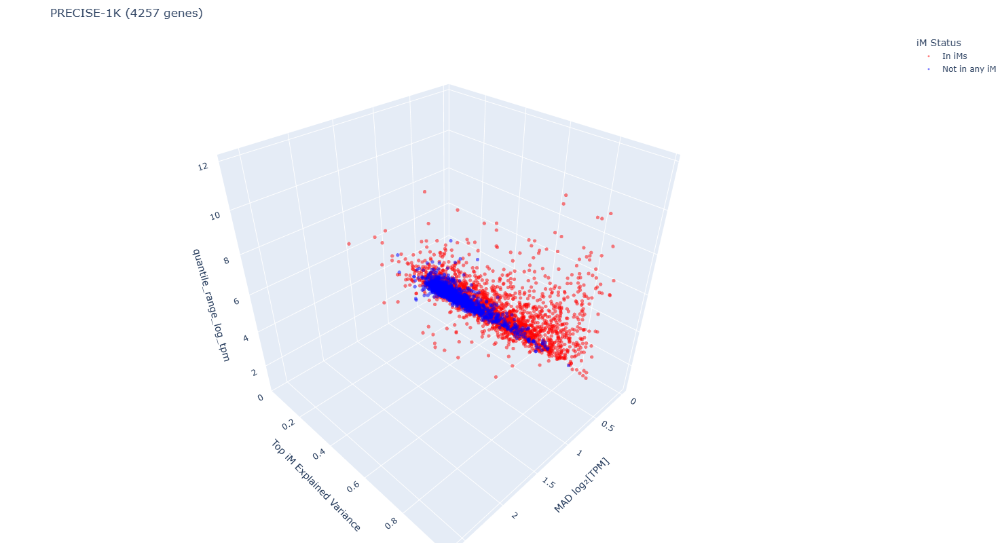

In [46]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','quantile_range_log_tpm', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'quantile_range_log_tpm',  'PRECISE-1K (4257 genes)')

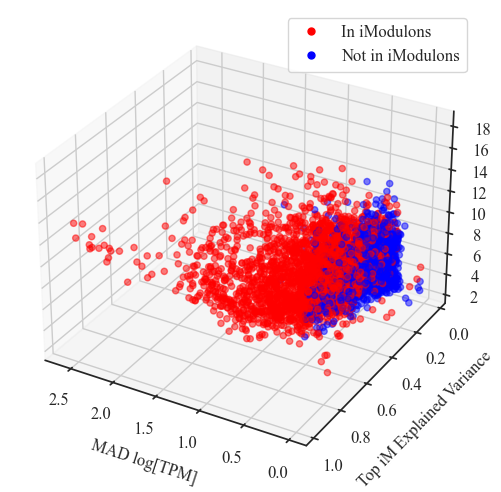

In [66]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.font_manager as fm
import pandas as pd
import matplotlib.lines as mlines  # Import for creating legend handles

def scatter_plot_3d_matplotlib(dataframe, x_column, y_column, z_column, x_label, y_label, z_label, 
                               width=6, height=6.5, marker_size=20, 
                               font_path='/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman.ttf', 
                               elev=30, azim=120, output_path="output_plot.svg"):
    # Make a copy of the dataframe to avoid modifying the original
    df_copy = dataframe.copy()
    
    # Create a new column in the dataframe to hold the color based on the condition
    df_copy['color'] = df_copy['num_iM'].apply(lambda x: 'blue' if x == 0 else 'red')
    
    # Load the custom font
    font_prop = fm.FontProperties(fname=font_path)
    
    # Create the figure and 3D axis
    fig = plt.figure(figsize=(width, height))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot the points
    scatter = ax.scatter(
        df_copy[x_column], df_copy[y_column], df_copy[z_column],
        c=df_copy['color'], s=marker_size, alpha=0.5
    )
    
    # Set the camera angle
    ax.view_init(elev=elev, azim=azim)
    
    # Set axis labels with custom font and adjusted label padding
    ax.set_xlabel(x_label, fontproperties=font_prop, labelpad=10)
    ax.set_ylabel(y_label, fontproperties=font_prop, labelpad=10)
    ax.set_zlabel(z_label, fontproperties=font_prop, labelpad=10)
    
    # Set tick labels font properties
    ax.tick_params(axis='x', labelsize=10, pad=5)
    ax.tick_params(axis='y', labelsize=10, pad=5)
    ax.tick_params(axis='z', labelsize=10, pad=5)
    
    # Apply the custom font to the tick labels
    for label in ax.get_xticklabels():
        label.set_fontproperties(font_prop)
    for label in ax.get_yticklabels():
        label.set_fontproperties(font_prop)
    for label in ax.get_zticklabels():
        label.set_fontproperties(font_prop)
    
    # Create a custom legend
    red_marker = mlines.Line2D([], [], color='red', marker='o', linestyle='None', markersize=5, label='In iModulons')
    blue_marker = mlines.Line2D([], [], color='blue', marker='o', linestyle='None', markersize=5, label='Not in iModulons')
    
    
    # Apply the font and size to the legend
    ax.legend(handles=[red_marker, blue_marker], loc='best', fontsize=5, prop=font_prop)
    
    # Save the plot to an SVG file
    plt.savefig(output_path, format='svg')

    # Show the plot
    plt.show()

# Example usage of the function
scatter_plot_3d_matplotlib(P1K_merged, 
                           x_column='MAD', 
                           y_column='Top_1_Explained_Variance', 
                           z_column='range_log_tpm', 
                           x_label='MAD log[TPM]', 
                           y_label='Top iM Explained Variance', 
                           z_label='Range log[TPM]', 
                           output_path='3d_scatter_plot.svg')


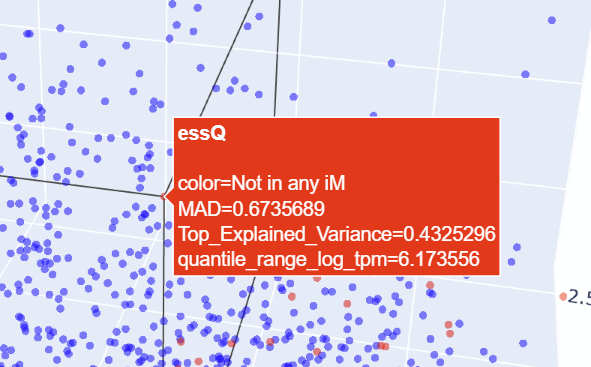

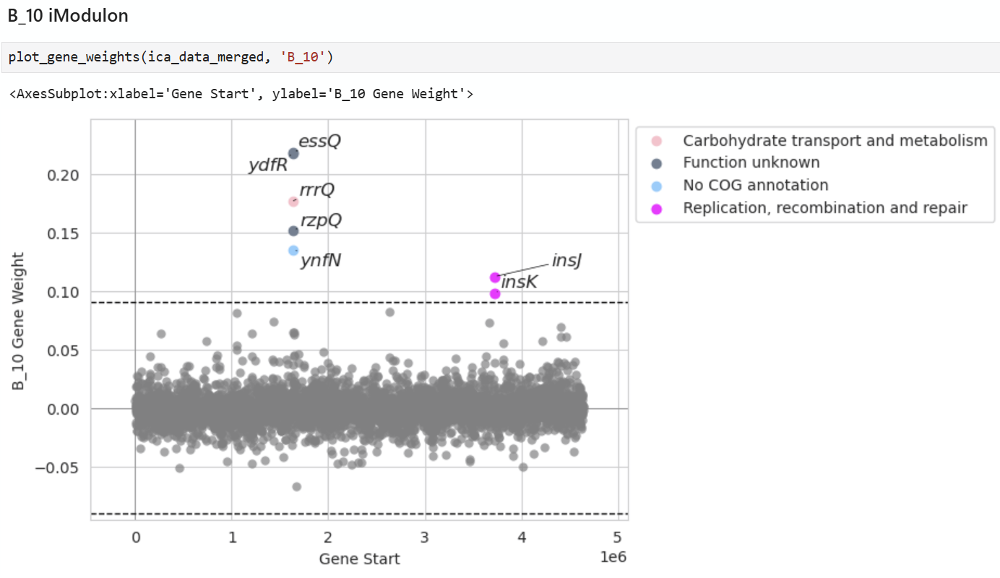

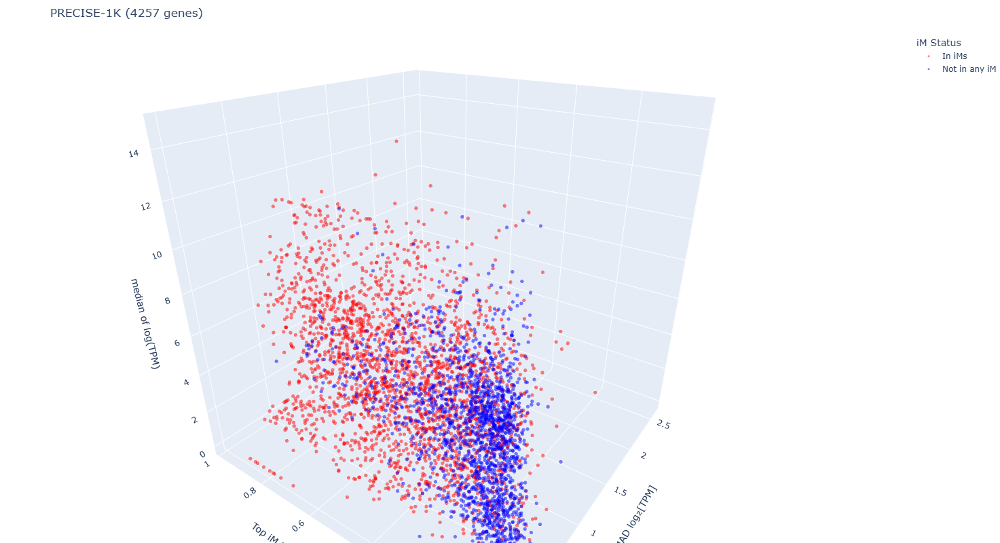

In [77]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','log_TPM_median', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'median of log(TPM)',  'PRECISE-1K (4257 genes)')

In [56]:
import plotly.graph_objs as go
import plotly.express as px

def scatter_plot_3d(dataframe, x_column, y_column, z_column, x_label, y_label, z_label, title, width=1500, height=800, marker_size=3):
    # Make a copy of the dataframe to avoid modifying the original
    df_copy = dataframe.copy()
    
    # Create a new column in the dataframe to hold the color based on the condition
    df_copy['color'] = df_copy['num_iterative_iM'].apply(lambda x: 'Not in any iterative iM' if x == 0 else 'In iterative iMs')
    
    # Create a hover text column that includes the row index and starts a new line after the index
    df_copy['hover_text'] = df_copy.index.astype(str)

    # Create the 3D scatter plot
    fig = px.scatter_3d(
        df_copy,
        x=x_column,
        y=y_column,
        z=z_column,
        color='color',  # Use the color column for coloring the points
        opacity=0.5,  # Set the opacity to 50% for overlap visualization
        color_discrete_map={'Not in any iM': 'red', 'In iMs': 'blue'},  # Map the labels to colors
        hover_name='hover_text'  # Use the hover_text for hover information
    )
    
    # Adjust the marker size
    fig.update_traces(marker=dict(size=marker_size))

    # Update the layout with titles and size
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title=x_label,
            yaxis_title=y_label,
            zaxis_title=z_label
        ),
        margin=dict(l=0, r=0, b=0, t=50),
        width=width,
        height=height,
        legend_title_text='iM Status'
    )
    
    # Show the plot
    fig.show()

In [57]:
# potF - putrescine 

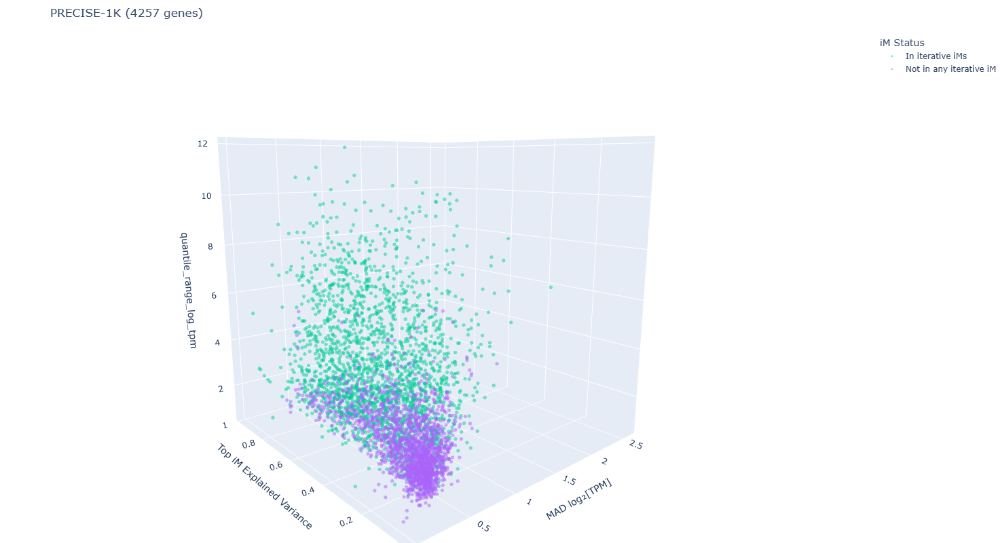

In [58]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','quantile_range_log_tpm', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'quantile_range_log_tpm',  'PRECISE-1K (4257 genes)')

In [59]:
iterative_M_Gene_Presence_Matrix.loc['pdeI'].sum()

1

In [60]:
iterative_M_Gene_Presence_Matrix.loc['yajO'].sum()

1

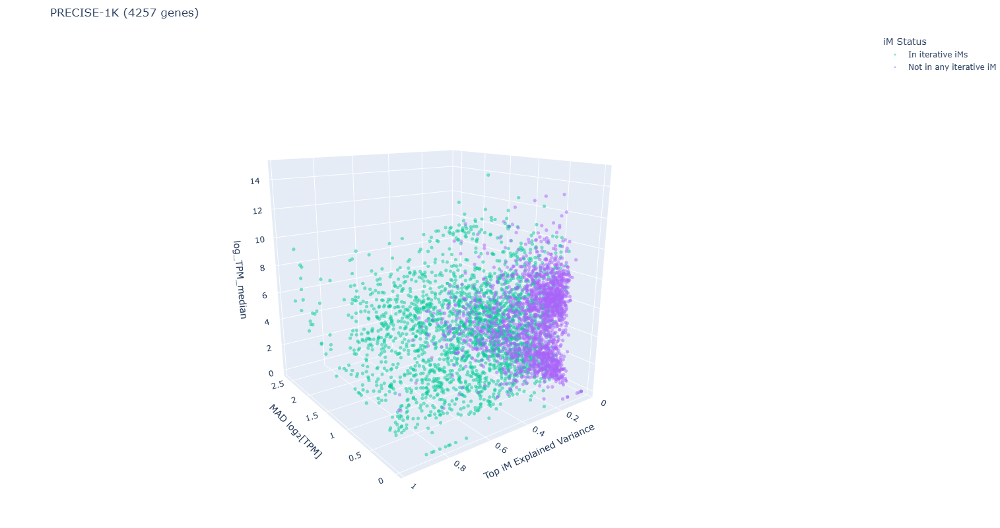

In [69]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','log_TPM_median', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'log_TPM_median',  'PRECISE-1K (4257 genes)')

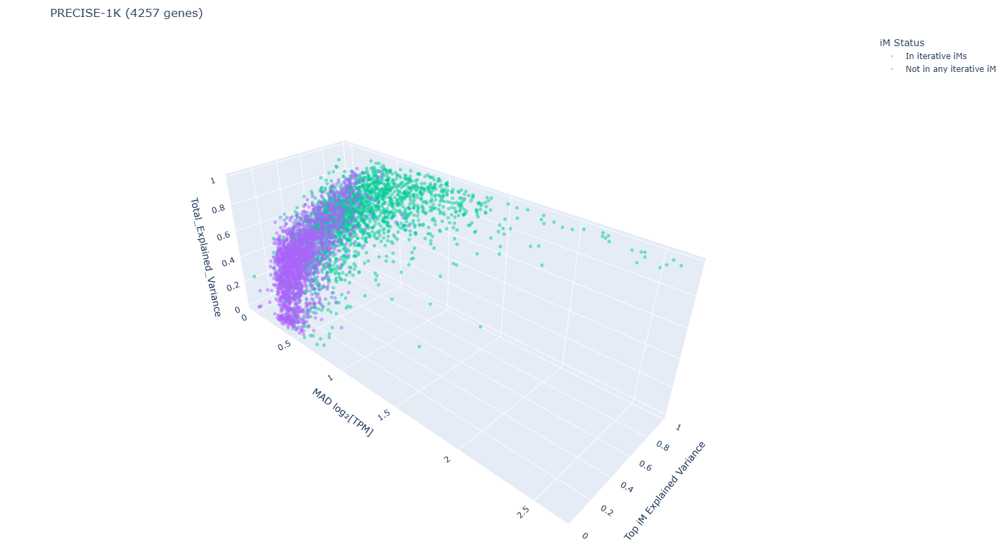

In [61]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','Total_Explained_Variance', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'Total_Explained_Variance',  'PRECISE-1K (4257 genes)')

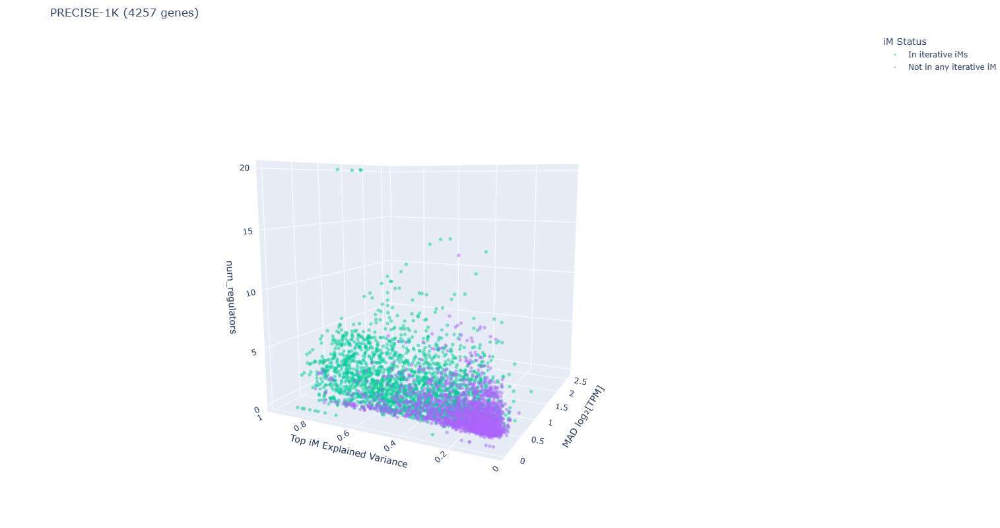

In [62]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','num_regulators', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'num_regulators',  'PRECISE-1K (4257 genes)')

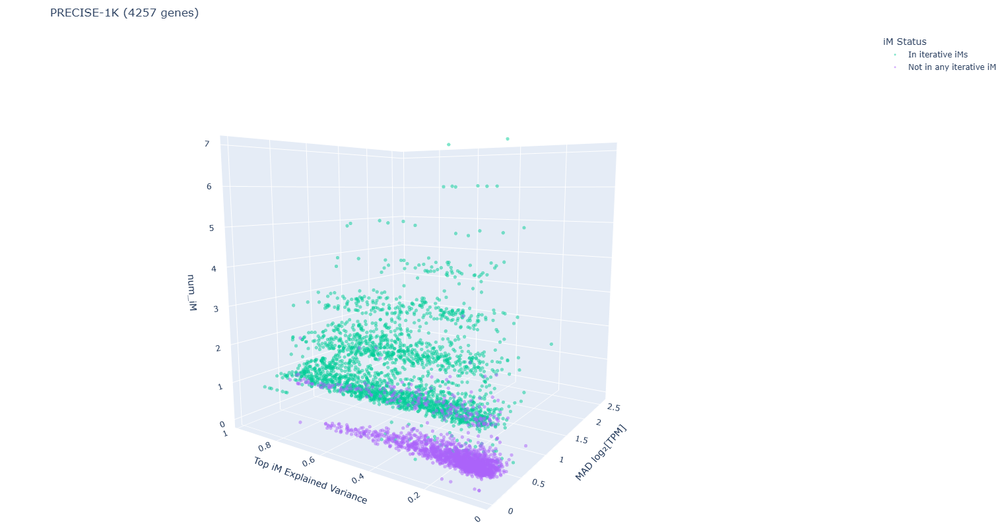

In [64]:
scatter_plot_3d(P1K_merged, 'MAD', 'Top_1_Explained_Variance','num_iM', 'MAD log₂[TPM]', 'Top iM Explained Variance', 'num_iM',  'PRECISE-1K (4257 genes)')

In [66]:
P1K_merged

,Total_Explained_Variance,Top_1_Explained_Variance,Top_1_iModulon,Top_2_Explained_Variance,Top_2_iModulon,Top_3_Explained_Variance,Top_3_iModulon,num_regulators,num_iM,MAD,log_TPM_median,range_log_tpm,quantile_range_log_tpm,num_iterative_iM
thrA,0.899430,0.686194,thrA KO,0.076638,Cysteine-1,0.075628,Thiamine-1,3,3,0.708056,9.605329,11.771901,4.398331,4
thrB,0.808533,0.254512,thrA KO,0.227884,Leu/Val/Ile,0.103394,Leucine,1,2,0.698585,9.225274,7.560994,3.900854,1
thrC,0.824916,0.246587,thrA KO,0.234486,Leu/Val/Ile,0.155906,Dipeptide,1,1,0.612527,9.272277,7.647762,3.681351,1
yaaX,0.689923,0.171007,Leu/Val/Ile,0.169602,Nucleotide Stress,0.095365,Glycolate,0,3,0.737335,6.283661,11.817918,4.395201,3
yaaA,0.638300,0.428612,OxyR,0.171808,Cold Shock,0.129606,UC-8,0,1,0.306569,6.346626,8.667107,1.920613,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yneP,0.748917,0.629455,yneP,0.075002,GadXW,0.047460,Resistance,0,1,1.059936,1.140369,4.458041,2.868327,1
ynfT,0.467147,0.424437,Cold Shock,0.045140,NRZ,0.033476,LPS,0,2,1.776698,2.466008,7.650393,6.189466,2
yoaL,0.333663,0.102746,CpxR,0.066571,Cellulose,0.044315,ppGpp,0,2,0.540346,5.048395,5.552991,2.841891,2
yqhI,0.894360,0.738529,yqhI,0.091457,UC-8,0.084815,Resistance,0,2,1.195671,1.195671,7.305199,4.985373,1


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (4257,) + inhomogeneous part.

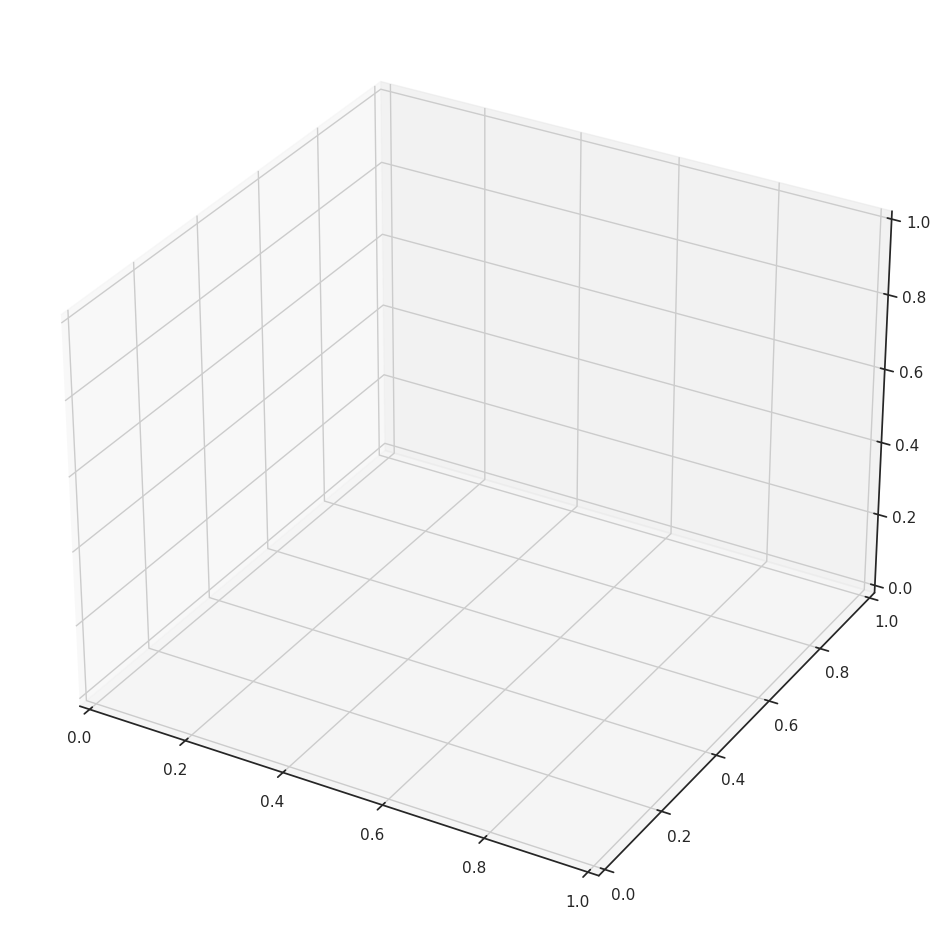

In [67]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches
from matplotlib.colors import Normalize

# Extracting columns
x = P1K_merged['MAD']
y = P1K_merged['Top_1_Explained_Variance']
z = P1K_merged['num_regulators']
num_iM = P1K_merged['num_iM']

# Creating a color map
norm = Normalize(vmin=1, vmax=7)
colors = ['black' if i == 0 else plt.cm.autumn(norm(i)) for i in num_iM]

# Creating legend elements
legend_elements = [mpatches.Patch(color='black', label='0')] + \
                  [mpatches.Patch(color=plt.cm.autumn(norm(i)), label=f'{i}') for i in range(1, 8)]

# Plotting
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(x, y, z, c=colors)

ax.set_xlabel('MAD log2(TPM)', fontsize=12)
ax.set_ylabel('Explained Variance', fontsize=12)
ax.set_zlabel('Number of regulators from RegulonDB', fontsize=12)
plt.title('Gene expression MAD v.s. Explained Variance v.s. Number of regulators from RegulonDB', fontsize=14)

# Adding the legend
ax.legend(handles=legend_elements, title="Number of iModulons", loc='best')

ax.view_init(elev=30, azim=140)

plt.show()